# Clean uncertainty + sensitivity workflow

This notebook is the publication-facing uncertainty workflow for BC1, BC2, BO1, and BO2. It **reuses the exact same Brightway databases, LCI→TEA compiler, TEA financial profile, national electricity baseline, and market-reference loaders as notebook 01**.

Method implemented here:
1. hard baseline reconciliation against deterministic notebook 01;
2. range/provenance audit;
3. Stage-1 global Monte Carlo screen (**1000** joint samples/pathway);
4. shortlist = top **5** variables per target, merged across targets/pathways;
5. directional OAT low / deterministic baseline / high on the shortlist;
6. Stage-2 joint Monte Carlo (**5000** samples/pathway);
7. publication Figure 4 and SI uncertainty figures.

Optional Sobol and reagent-design diagnostics are retained but are not required for the main two-stage method.

The main manuscript describes the same 1000-screen → top-5 shortlist → OAT → 5000-MC workflow.


## 0. Paths, project, and run controls


In [28]:
from pathlib import Path
import json
import sys
import time
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

HERE = Path.cwd().resolve()
_candidates = [HERE, HERE.parent, HERE.parent.parent]
PROJECT_ROOT = next((p for p in _candidates if (p / "graphite_sus").exists()), None)
if PROJECT_ROOT is None:
    raise RuntimeError("Could not locate clean project root containing graphite_sus/")
sys.path.insert(0, str(PROJECT_ROOT))

import graphite_sus
PKG_DIR = Path(graphite_sus.__file__).resolve().parent

LCI_XLSX = PKG_DIR / "data" / "test" / "meb_bw_char_coke_v96.xlsx"
TEA_XLSX = PKG_DIR / "data" / "test" / "meb_tea_char_coke_v53.xlsx"
PRICE_PARAMETERS_XLSX = PKG_DIR / "data" / "test" / "process_parameters_charcoke_v2.xlsx"
SPEC_CSV = PKG_DIR / "data" / "uncertainty_spec.csv"

OUT = PROJECT_ROOT / "result" / "uncertainty"
OUT.mkdir(parents=True, exist_ok=True)

PROJECT_NAME = "graphite_sys_v3"
LCA_SYS_DB = "graphite_system"
TEA_SYS_DB = "graphite_system_tea"
TEA_PROFILE = "literature_hybrid"
ELECTRICITY_MODE = "national_2025"

# First migrated run: keep this False. The notebook will execute all baseline
# and range checks, but will not launch the ~1000 + 5000 sample production runs.
# After the preflight gate passes, set True and Restart & Run All.
RUN_FULL_ANALYSIS = True
RUN_OPTIONAL_SOBOL = False
RUN_REAGENT_CASES = False
MAX_WORKERS = 1  # safest Brightway default; increase after a stable serial run

for p in (LCI_XLSX, TEA_XLSX, PRICE_PARAMETERS_XLSX, SPEC_CSV):
    if not p.exists():
        raise FileNotFoundError(p)

print("Project root:", PROJECT_ROOT)
print("Output:", OUT)
print("RUN_FULL_ANALYSIS:", RUN_FULL_ANALYSIS)
print("RUN_OPTIONAL_SOBOL:", RUN_OPTIONAL_SOBOL)


Project root: /mnt/g/My Drive/yale/Project-graphite/graphite_clean_project_spatial_v2_with_03b_legacy_visualization/graphite_clean_project_spatial_v2
Output: /mnt/g/My Drive/yale/Project-graphite/graphite_clean_project_spatial_v2_with_03b_legacy_visualization/graphite_clean_project_spatial_v2/result/uncertainty
RUN_FULL_ANALYSIS: True
RUN_OPTIONAL_SOBOL: False


## 1. Reuse the deterministic Brightway databases


In [29]:
from graphite_sus.database_setup import ensure_databases
from graphite_sus.fuel_reference import (
    load_fuel_references,
    audit_system_fuel_reference,
    fuel_reference_manifest,
)
from graphite_sus.electricity_regeneration import (
    load_reference as load_electricity_ef_reference,
    audit_system_electricity_reference,
    electricity_reference_manifest as electricity_ef_reference_manifest,
)

database_manifest = ensure_databases(
    project_name=PROJECT_NAME,
    lci_workbook=LCI_XLSX,
    rebuild=False,
)

fuel_references = load_fuel_references()
fuel_ef_audit = audit_system_fuel_reference(LCA_SYS_DB)
assert not fuel_ef_audit.empty
assert bool(fuel_ef_audit["passed"].all())
fuel_ef_audit.to_csv(OUT / "fuel_ef_reference_audit.csv", index=False)

display(fuel_references[[
    "carrier", "impact_category", "provider_low",
    "provider_representative", "provider_high", "provider_unit",
]])
print("Fuel-EF central reference applied:", len(fuel_ef_audit), "activity-parameter rows")

electricity_ef_references = load_electricity_ef_reference()
electricity_ef_audit = audit_system_electricity_reference(LCA_SYS_DB)
assert not electricity_ef_audit.empty
assert bool(electricity_ef_audit["passed"].all())
electricity_ef_audit.to_csv(OUT / "electricity_ef_reference_audit.csv", index=False)
display(electricity_ef_references[[
    "impact_category", "regional_low", "provider_representative",
    "regional_high", "provider_unit",
]])
print("Electricity-EF LCIA reference verified:", len(electricity_ef_audit), "activity-parameter rows")
database_manifest


,carrier,impact_category,provider_low,provider_representative,provider_high,provider_unit
0,natural_gas,climate change,0.508841,0.709453,0.910065,m3 natural gas
1,natural_gas,acidification,0.002942,0.005252,0.007563,m3 natural gas
2,natural_gas,eutrophication,0.000182,0.000328,0.000473,m3 natural gas
3,natural_gas,ecotoxicity: freshwater,0.224152,1.401552,2.578951,m3 natural gas
4,natural_gas,particulate matter formation,0.000057,0.000101,0.000144,m3 natural gas
5,natural_gas,photochemical oxidant formation,0.101938,0.182250,0.262561,m3 natural gas
6,diesel,climate change,0.688841,0.785507,0.882172,kg diesel
7,diesel,acidification,0.000671,0.000866,0.001062,kg diesel
8,diesel,eutrophication,0.000044,0.000055,0.000066,kg diesel
9,diesel,ecotoxicity: freshwater,0.250054,0.356956,0.463859,kg diesel


Fuel-EF central reference applied: 48 activity-parameter rows


,impact_category,regional_low,provider_representative,regional_high,provider_unit
0,climate change,0.232226,0.472844,0.894510,kg CO2-eq/kWh
1,acidification,0.000254,0.001124,0.005731,kg SO2-eq/kWh
2,eutrophication,0.000120,0.002212,0.005144,kg N-eq/kWh
3,ecotoxicity: freshwater,1.934268,4.028041,6.984719,CTUe/kWh
4,particulate matter formation,0.000039,0.000753,0.002107,kg PM2.5-eq/kWh
5,photochemical oxidant formation,0.006355,0.014089,0.064376,kg O3-eq/kWh


Electricity-EF LCIA reference verified: 24 activity-parameter rows


{'project': 'graphite_sys_v3',
 'rebuild': False,
 'databases': ['graphite_prod_char', 'graphite_system', 'graphite_system_tea'],
 'fuel_ef_reference': {'natural_gas / climate change': {'carrier': 'natural_gas',
   'impact_category': 'climate change',
   'method_name': 'IPCC 2021',
   'provider_slug': 'market_for_natural_gas_high_pressure__US',
   'regional_low_per_MJ': 0.0142134331337238,
   'regional_representative_per_MJ': 0.0198171268720055,
   'regional_high_per_MJ': 0.0254208206102872,
   'impact_unit_per_MJ': 'kg CO2-eq/MJ',
   'provider_low': 0.508840906187312,
   'provider_representative': 0.7094531420177969,
   'provider_high': 0.9100653778482816,
   'provider_unit': 'm3 natural gas',
   'LHV_MJ_per_provider_unit': 35.8,
   'representative_basis': 'midrange_of_regenerated_regional_min_max',
   'method_provenance_status': 'IPCC_AR6_GWP100_REGENERATED_FROM_NETL_ELEMENTARY_FLOWS',
   'source': 'NETL-RIC ElectricityLCI raw upstream inventory; IPCC AR6 GWP100',
   'ref': 'NETL com

Notebook 02 **does not rebuild** the foreground/system databases. If this cell reports a missing database, run notebook 01 once with `REBUILD_DATABASES=True`, then return here. This prevents uncertainty from accidentally being evaluated on a different collapsed system.


## 2. Load the central protocol, ranges, and economic references


In [30]:
import graphite_sus.uncertainty.screen as S
import graphite_sus.uncertainty.cases as CA
import graphite_sus.uncertainty.ranges as R
import graphite_sus.uncertainty.oat as O
import graphite_sus.uncertainty.post_mc as PMC
import graphite_sus.uncertainty.conformance as CONF

from graphite_sus.uncertainty.protocol import PROTOCOL, IMPACT_CATEGORIES
from graphite_sus.uncertainty.spec import UncertaintySpec
from graphite_sus.electricity_reference import (
    load_electricity_references,
    get_national_electricity_price,
    get_electricity_uncertainty_range,
    electricity_reference_manifest,
)
from graphite_sus.market_reference import (
    load_market_references,
    get_market_ranges,
    get_market_means,
    market_reference_manifest,
)

CFG = S.ScreenConfig(
    use_display=False,
    tea_profile=TEA_PROFILE,
    electricity_mode=ELECTRICITY_MODE,
)
spec = UncertaintySpec.load(SPEC_CSV)

KW = dict(
    workbook_path=str(TEA_XLSX),
    price_parameters_path=str(PRICE_PARAMETERS_XLSX),
    lca_sys_db=LCA_SYS_DB,
    tea_sys_db=TEA_SYS_DB,
)

print("Protocol:", PROTOCOL.to_dict())
display(load_electricity_references())
display(load_market_references())

p0 = get_national_electricity_price()
plo, phi = get_electricity_uncertainty_range()
assert abs(p0 - 0.0862) < 1e-12
assert abs(plo - 0.0588) < 1e-12
assert abs(phi - 0.2215) < 1e-12
assert PROTOCOL.screen.n_iterations == 1000
assert PROTOCOL.screen.top_k_per_target == 5
assert PROTOCOL.monte_carlo.n_iterations == 5000
print(f"Electricity baseline/range = {p0:.4f} / [{plo:.4f}, {phi:.4f}] USD/kWh")


Protocol: {'lci_default_pct': 0.3, 'price_default_pct': 0.2, 'stage_bounds': (0.5, 1.5), 'allocation_scheme': 'mass', 'screen': {'n_iterations': 1000, 'top_k_per_target': 5, 'seed': 0, 'per_method': True}, 'oat': {'levels': ('low', 'baseline', 'high')}, 'attribution': {'sobol_N': 128, 'sobol_seed': 0, 'calc_second_order': False, 'surrogate_min_r2': 0.95, 'convergence_max_delta_ST': 0.05}, 'monte_carlo': {'n_iterations': 5000, 'seed': 0, 'distribution': 'uniform'}}


,reference,baseline,low,high,unit,geography,price_year,source,ref,note
0,US_industrial,0.0862,0.0588,0.2215,USD/kWh,U.S.,2025,EIA_and_project_selected_range,https://www.eia.gov/electricity/monthly/epm_ta...,Authoritative project electricity reference ap...


,market_type,quantity,lo,hi,mean,unit,geography,source,ref,note
0,natural,MSP,2.8,4.5,3.65,USD/kg,U.S.,project_selected_market_range,NaN,Authoritative project market-natural-graphite ...
1,synthetic,MSP,4.2,5.3,4.75,USD/kg,U.S.,project_selected_market_range,NaN,Authoritative project market-synthetic-graphit...


Electricity baseline/range = 0.0862 / [0.0588, 0.2215] USD/kWh


## 3. Reagent uncertainty case and fixed-ratio dependency audit


The existing main uncertainty analysis is preserved: **Fe uses the declared span** and **HCl uses the recycled case**. The Fe span is therefore treated exactly as in the current uncertainty analysis; it is not replaced during this migration.


In [31]:
from graphite_sus.uncertainty.evaluate import Evaluator
import graphite_sus.uncertainty.coupling as C

REAGENT_CASE = {"Fe": "declared_span", "HCl": "recycled"}
print(CA.describe_assignment(REAGENT_CASE))

evaluators = {
    sc: Evaluator(sc, list(IMPACT_CATEGORIES), cfg=CFG, **KW)
    for sc in S.DEFAULT_SCENARIOS
}
ev_defaults = {sc: ev.default_point() for sc, ev in evaluators.items()}

# The uncertainty default must use the central national electricity value.
for sc, x0 in ev_defaults.items():
    if "p__electricity" in x0:
        assert np.isclose(x0["p__electricity"], get_national_electricity_price())

# Direct fossil CO2 from foreground natural-gas combustion is derived rather
# than sampled independently.
dependency_rows = []
for sc, ev in evaluators.items():
    for dep, (drv, ratio) in ev.dependencies.items():
        if dep.startswith("bio__") and dep.endswith("__Carbon_dioxide_fossil"):
            dependency_rows.append({
                "pathway": sc,
                "dependent": dep,
                "driver": drv,
                "ratio": ratio,
                "ratio_unit": "kg fossil CO2 / m3 natural gas",
            })
            assert C.NG_FOSSIL_CO2_RATIO_BOUNDS[0] <= ratio <= C.NG_FOSSIL_CO2_RATIO_BOUNDS[1]

dependency_audit = pd.DataFrame(dependency_rows)
display(dependency_audit.round({"ratio": 6}))

spec_case = CA.apply_to_spec(spec, ev_defaults, REAGENT_CASE)
print("Declared reagent ranges retained:", getattr(spec_case, "reagent_kept_declared", []))
print("Reagent rows replaced:", len(getattr(spec_case, "reagent_replacements", [])))


Fe: declared_span (centre model default) -- keep the spec range (0.12, 3.06) unchanged, which spans recycled through once-through. Use only for a deliberate all-modes sweep -- it mixes operating modes, so its spread is not uncertainty about one plant
HCl: recycled (centre model default) -- make-up only; the model default (0.1991 char / 0.2008 coke). HCl is readily recovered, so this is the base case
{'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Carbon_dioxide_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 1.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__non_urban_air_or_from_high_stacks': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__urban_air_close_to_ground': {'database': 'graphite_system'

,pathway,dependent,driver,ratio,ratio_unit
0,s_c2,bio__slow_pyrolysis_biochar_production_biooil_...,tech__slow_pyrolysis_biochar_production_biooil...,1.923,kg fossil CO2 / m3 natural gas
1,s_o1,bio__fast_pyrolysis_coke_production__Carbon_di...,tech__fast_pyrolysis_coke_production__market_f...,1.923,kg fossil CO2 / m3 natural gas
2,s_o2,bio__fast_pyrolysis_coke_production_with_biooi...,tech__fast_pyrolysis_coke_production_with_bioo...,1.923,kg fossil CO2 / m3 natural gas


Declared reagent ranges retained: ['Fe']
Reagent rows replaced: 4


## 4. HARD GATE — uncertainty default must reproduce deterministic notebook 01


In [32]:
from graphite_sus.uncertainty.baseline import (
    reconcile_baseline,
    assert_baseline_reconciled,
)

baseline_reconciliation = reconcile_baseline(
    scenarios=S.DEFAULT_SCENARIOS,
    methods=IMPACT_CATEGORIES,
    cfg=CFG,
    spec=spec_case,
    **KW,
)
baseline_reconciliation.to_csv(OUT / "baseline_reconciliation.csv", index=False)
display(baseline_reconciliation)
assert_baseline_reconciled(baseline_reconciliation)
print("BASELINE RECONCILIATION: PASS")


{'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Carbon_dioxide_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 1.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__non_urban_air_or_from_high_stacks': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Methane_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 29.8}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Nitrogen_oxides__air__non_urban_air_or_from_high_stac

,scenario,pathway,target,deterministic,uncertainty_default,abs_delta,rel_delta,passed
0,s_c1,BC1,MSP,4.322083,4.322083,0.000000e+00,0.000000e+00,True
1,s_c1,BC1,IPCC 2021__climate change__global warming pote...,5.191801,5.191801,0.000000e+00,0.000000e+00,True
2,s_c1,BC1,TRACI v2.1__eutrophication__eutrophication pot...,0.024280,0.024280,0.000000e+00,0.000000e+00,True
3,s_c1,BC1,TRACI v2.1__acidification__acidification poten...,0.019165,0.019165,0.000000e+00,0.000000e+00,True
4,s_c1,BC1,TRACI v2.1__ecotoxicity: freshwater__ecotoxici...,95.939231,95.939231,0.000000e+00,0.000000e+00,True
5,s_c1,BC1,TRACI v2.1__particulate matter formation__part...,0.006867,0.006867,0.000000e+00,0.000000e+00,True
6,s_c1,BC1,TRACI v2.1__photochemical oxidant formation__m...,0.281970,0.281970,0.000000e+00,0.000000e+00,True
7,s_c2,BC2,MSP,4.399352,4.399352,0.000000e+00,0.000000e+00,True
8,s_c2,BC2,IPCC 2021__climate change__global warming pote...,5.224075,5.224075,0.000000e+00,0.000000e+00,True
9,s_c2,BC2,TRACI v2.1__eutrophication__eutrophication pot...,0.018823,0.018823,0.000000e+00,0.000000e+00,True


BASELINE RECONCILIATION: PASS


This gate specifically prevents the old midpoint-coproduct-split problem: the uncertainty evaluator converts the **stored deterministic hydrocarbon split** back to its stick coordinates, so `x0` must reproduce notebook 01 exactly.


## 5. Audit every uncertainty range before sampling


In [33]:
audits = {
    sc: R.range_audit(
        sc,
        IMPACT_CATEGORIES,
        spec=spec_case,
        cfg=CFG,
        **KW,
    )
    for sc in S.DEFAULT_SCENARIOS
}
range_audit_all = pd.concat(
    [df.assign(scenario=sc) for sc, df in audits.items()],
    ignore_index=True,
)
range_audit_all.to_csv(OUT / "range_audit.csv", index=False)

for sc, df in audits.items():
    bad = df.loc[~df["covers_base"]]
    print(
        f"{sc}: {len(df):3} variables | "
        f"{(df.source == 'spec').sum():3} spec-backed | "
        f"{(df.source == 'model_pct').sum():3} model-fallback | "
        f"{len(bad)} not covering baseline"
    )

display(range_audit_all.loc[~range_audit_all["covers_base"]].head(30))


{'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Carbon_dioxide_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 1.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__non_urban_air_or_from_high_stacks': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Methane_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 29.8}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Nitrogen_oxides__air__non_urban_air_or_from_high_stac

,variable,kind,lo,hi,base,source,basis,ref,rel_lo,rel_hi,covers_base,scenario


In [34]:
from graphite_sus.uncertainty.ranges import fallback_summary

SCENARIO_LABELS = {
    "s_c1": "BC1",
    "s_c2": "BC2",
    "s_o1": "BO1",
    "s_o2": "BO2",
}

summary = fallback_summary(
    audits,
    scenario_labels=SCENARIO_LABELS,
)

print("Uncertainty fallback summary")
print("----------------------------")
display(summary)

print(
    "\nProtocol-default ranges are used only where no "
    "variable-specific uncertainty range is available. "
    "See range_audit.csv for complete provenance."
)

Uncertainty fallback summary
----------------------------


basis,default_lci_pct,default_price_pct
scenario,,
BC1,112,0
BC2,145,0
BO1,125,0
BO2,183,0



Protocol-default ranges are used only where no variable-specific uncertainty range is available. See range_audit.csv for complete provenance.


In [35]:
YIELD_FACTORS = {
    "x biomass/graphite (char)": 1 / (0.279144 * 0.719853),
    "/ biomass/graphite (char)": 0.279144 * 0.719853,
    "x biomass/graphite (coke)": 1 / (0.147 * 0.772109),
    "/ biomass/graphite (coke)": 0.147 * 0.772109,
}
uncovered = R.uncovered_report(audits, spec=spec_case, yield_factors=YIELD_FACTORS)
uncovered.to_csv(OUT / "ranges_not_covering_default.csv", index=False)
if uncovered.empty:
    print("All declared ranges cover the deterministic baseline.")
else:
    display(uncovered.sort_values("outside_by", ascending=False).head(40))


All declared ranges cover the deterministic baseline.


## 6. Uncertainty preflight acceptance gate


In [36]:
preflight_checks = {
    "deterministic_baseline_reconciled": bool(baseline_reconciliation["passed"].all()),
    "electricity_baseline_baseline": abs(get_national_electricity_price() - 0.0862) < 1e-12,
    "electricity_range_min_max": np.allclose(get_electricity_uncertainty_range(), (0.0588, 0.2215)),
    "screen_protocol_1000": PROTOCOL.screen.n_iterations == 1000,
    "shortlist_protocol_top5": PROTOCOL.screen.top_k_per_target == 5,
    "mc_protocol_5000": PROTOCOL.monte_carlo.n_iterations == 5000,
    "tea_profile_literature_hybrid": CFG.tea_profile == "literature_hybrid",
    "full_inventory_lca": CFG.use_display is False,
    "netl_fuel_reference_applied": (not fuel_ef_audit.empty) and bool(fuel_ef_audit["passed"].all()),
    "fuel_ranges_cover_central_reference": bool(range_audit_all.loc[
        range_audit_all["variable"].str.contains("market_for_diesel__RoW|market_for_natural_gas_high_pressure__US", regex=True)
    , "covers_base"].all()),
}
preflight_table = pd.DataFrame([{"check": k, "passed": v} for k, v in preflight_checks.items()])
display(preflight_table)
assert all(preflight_checks.values())
print("UNCERTAINTY PREFLIGHT ACCEPTED")
if not RUN_FULL_ANALYSIS:
    print("Set RUN_FULL_ANALYSIS=True, then Restart & Run All for Stage 1 → OAT → Stage 2 MC.")


,check,passed
0,deterministic_baseline_reconciled,True
1,electricity_baseline_baseline,True
2,electricity_range_min_max,True
3,screen_protocol_1000,True
4,shortlist_protocol_top5,True
5,mc_protocol_5000,True
6,tea_profile_literature_hybrid,True
7,full_inventory_lca,True
8,netl_fuel_reference_applied,True
9,fuel_ranges_cover_central_reference,True


UNCERTAINTY PREFLIGHT ACCEPTED


## 7. Stage 1 — 1000-sample global screening


In [37]:
screens = None
chosen = None
union = None
if RUN_FULL_ANALYSIS:
    t0 = time.time()
    screens = S.run_screen(
        S.DEFAULT_SCENARIOS,
        IMPACT_CATEGORIES,
        cfg=CFG,
        spec=spec_case,
        max_workers=MAX_WORKERS,
        progress=True,
        **KW,
    )
    joblib.dump(screens, OUT / "stage1_screens.pkl", compress=3)

    for sc, result in screens.items():
        sampled_direct_co2 = [
            c for c in result.samples.columns
            if str(c).startswith("bio__") and str(c).endswith("__Carbon_dioxide_fossil")
        ]
        assert not sampled_direct_co2, f"{sc}: direct fossil CO2 sampled independently"
        assert result.n_failed_tea == 0, f"{sc}: {result.n_failed_tea} failed TEA solves"

    print(f"Stage 1 completed in {(time.time()-t0)/60:.1f} min")
else:
    print("SKIPPED: RUN_FULL_ANALYSIS=False")


[screen] s_c1 ...


{'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Carbon_dioxide_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 1.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__non_urban_air_or_from_high_stacks': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Methane_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 29.8}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Nitrogen_oxides__air__non_urban_air_or_from_high_stac

## 8. Build and freeze the top-5-per-target shortlist


In [38]:
if RUN_FULL_ANALYSIS:
    chosen = S.choose_features_by_method(
        screens,
        IMPACT_CATEGORIES,
        PROTOCOL.screen.top_k_per_target,
    )
    S.write_chosen(
        OUT / "chosen_by_method.json",
        chosen,
        screens=screens,
        cfg=CFG,
        lca_sys_db=LCA_SYS_DB,
        extra={
            "spec_csv": str(SPEC_CSV),
            "tea_profile": TEA_PROFILE,
            "electricity_reference": electricity_reference_manifest(),
        },
    )
    union = sorted({
        f
        for d in chosen.values()
        for target in ("lcia", "msp")
        for f in d[target]
    })
    dependent_co2 = [
        v for v in union
        if str(v).startswith("bio__") and str(v).endswith("__Carbon_dioxide_fossil")
    ]
    assert not dependent_co2
    print(f"Shortlist union: {len(union)} variables")
    display(pd.DataFrame({"variable": union}))
else:
    print("SKIPPED")


Shortlist union: 31 variables


,variable
0,UF_IPCC_2021__climate_change__global_warming_p...
1,UF_IPCC_2021__climate_change__global_warming_p...
2,UF_TRACI_v2_1__acidification__acidification_po...
3,UF_TRACI_v2_1__ecotoxicity_freshwater__ecotoxi...
4,UF_TRACI_v2_1__ecotoxicity_freshwater__ecotoxi...
5,UF_TRACI_v2_1__eutrophication__eutrophication_...
6,UF_TRACI_v2_1__eutrophication__eutrophication_...
7,UF_TRACI_v2_1__particulate_matter_formation__p...
8,UF_TRACI_v2_1__particulate_matter_formation__p...
9,UF_TRACI_v2_1__particulate_matter_formation__p...


## 9. OAT directional sensitivity on exactly the Stage-1 shortlist


In [39]:
oats = None
if RUN_FULL_ANALYSIS:
    oats = {
        sc: O.oat_scan(
            sc,
            IMPACT_CATEGORIES,
            spec=spec_case,
            cfg=CFG,
            variables=union,
            strict=True,
            **KW,
        )
        for sc in S.DEFAULT_SCENARIOS
    }
    for sc, df in oats.items():
        assert not df.empty
        if "base_inside_bounds" in df.columns:
            assert df["base_inside_bounds"].all(), f"{sc}: OAT baseline outside bounds"
        expected = 1 + 2 * len(df.attrs.get("scanned_variables", df))
        assert int(df.attrs.get("n_evaluations", expected)) == expected
    joblib.dump(oats, OUT / "oat_shortlist.pkl", compress=3)
    print("Saved OAT tables:", OUT / "oat_shortlist.pkl")
else:
    print("SKIPPED")


{'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Carbon_dioxide_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 1.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__non_urban_air_or_from_high_stacks': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Methane_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 29.8}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Nitrogen_oxides__air__non_urban_air_or_from_high_stac

## 10. Optional Sobol global-sensitivity diagnostic


In [40]:
sob_final = None
if RUN_FULL_ANALYSIS and RUN_OPTIONAL_SOBOL:
    from graphite_sus.uncertainty.sobol_driver import sobol_all_from_spec
    sob_final = sobol_all_from_spec(
        spec=spec_case,
        scenarios=S.DEFAULT_SCENARIOS,
        chosen_by_method=chosen,
        methods=IMPACT_CATEGORIES,
        workbook_path=str(TEA_XLSX),
        price_parameters_path=str(PRICE_PARAMETERS_XLSX),
        cfg=CFG,
        lca_sys_db=LCA_SYS_DB,
        tea_sys_db=TEA_SYS_DB,
        N=512,
        seed=PROTOCOL.attribution.sobol_seed,
        freeze_dir=OUT / "sobol_N512",
        progress=True,
    )
    joblib.dump(sob_final, OUT / "sobol_all_corrected_512.pkl", compress=3)
else:
    print("SKIPPED optional Sobol")


SKIPPED optional Sobol


## 11. Stage-2 shortlist and 16-sample Monte Carlo preflight


In [41]:
feats = None
mc_test = None
if RUN_FULL_ANALYSIS:
    from graphite_sus.uncertainty.montecarlo import mc_across_paths
    feats = {
        "lcia": sorted({f for d in chosen.values() for f in d["lcia"]}),
        "msp": sorted({f for d in chosen.values() for f in d["msp"]}),
    }
    feats_union = sorted(set(feats["lcia"]) | set(feats["msp"]))
    assert feats_union == union

    MC_TEST_N = 16
    mc_test = mc_across_paths(
        scenarios=S.DEFAULT_SCENARIOS,
        methods=list(IMPACT_CATEGORIES),
        features_by_target=feats,
        workbook_path=str(TEA_XLSX),
        price_parameters_path=str(PRICE_PARAMETERS_XLSX),
        spec=spec_case,
        cfg=CFG,
        n_mc=MC_TEST_N,
        seed=PROTOCOL.monte_carlo.seed,
        price_pct_perturb=PROTOCOL.price_default_pct,
        lca_sys_db=LCA_SYS_DB,
        tea_sys_db=TEA_SYS_DB,
        progress=True,
        fail_on_nonfinite=True,
    )
    n_outputs = 1 + len(IMPACT_CATEGORIES)
    assert len(mc_test) == len(S.DEFAULT_SCENARIOS) * MC_TEST_N * n_outputs
    assert np.isfinite(mc_test["value"]).all()
    assert (mc_test.groupby(["scenario_code", "sample"]).size() == n_outputs).all()
    assert all(all(v == 0 for v in d.values()) for d in mc_test.attrs["failures"].values())
    for sc in S.DEFAULT_SCENARIOS:
        X = mc_test.attrs["samples_by_scenario"][sc]
        assert len(X) == MC_TEST_N
        assert np.isfinite(X.to_numpy(float)).all()
    print("MC PREFLIGHT: PASS")
else:
    print("SKIPPED")


{'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Carbon_dioxide_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 1.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__non_urban_air_or_from_high_stacks': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Methane_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 29.8}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Nitrogen_oxides__air__non_urban_air_or_from_high_stac

## 12. Stage 2 — final 5000-sample joint Monte Carlo


In [42]:
mc = None
mc_inputs = None
mc_audit = None
if RUN_FULL_ANALYSIS:
    from graphite_sus.uncertainty.montecarlo import mc_across_paths
    N_MC = PROTOCOL.monte_carlo.n_iterations
    t0 = time.time()
    mc = mc_across_paths(
        scenarios=S.DEFAULT_SCENARIOS,
        methods=list(IMPACT_CATEGORIES),
        features_by_target=feats,
        workbook_path=str(TEA_XLSX),
        price_parameters_path=str(PRICE_PARAMETERS_XLSX),
        spec=spec_case,
        cfg=CFG,
        n_mc=N_MC,
        seed=PROTOCOL.monte_carlo.seed,
        price_pct_perturb=PROTOCOL.price_default_pct,
        lca_sys_db=LCA_SYS_DB,
        tea_sys_db=TEA_SYS_DB,
        progress=True,
        fail_on_nonfinite=True,
    )
    mc_inputs = mc.attrs["samples_by_scenario"]
    mc_audit = PMC.validate_mc(mc, mc_inputs)

    joblib.dump(mc, OUT / "mc_stage2_full.pkl", compress=3)
    joblib.dump(mc_inputs, OUT / "mc_stage2_inputs.pkl", compress=3)
    mc.to_csv(OUT / "mc_stage2.csv", index=False)
    mc_audit.to_csv(OUT / "mc_stage2_bounds_audit.csv", index=False)
    print(f"Stage 2 completed in {(time.time()-t0)/60:.1f} min")
    display(mc_audit.head(20))
else:
    print("SKIPPED")


{'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Carbon_dioxide_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 1.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__non_urban_air_or_from_high_stacks': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Dinitrogen_monoxide__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 273.0}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Methane_fossil__air__urban_air_close_to_ground': {'database': 'graphite_system', 'code': 'system::graphite_prod_char::graphtz_char', 'amount': 29.8}, 'CF_IPCC_2021__climate_change__global_warming_potential_GWP100__Nitrogen_oxides__air__non_urban_air_or_from_high_stac

,scenario,variable,lo,hi,source,sampled_min,sampled_max,inside_bounds,coverage_fraction
0,s_c1,UF_IPCC_2021__climate_change__global_warming_p...,0.377028,0.700194,spec,3.770892e-01,7.000541e-01,True,0.999376
1,s_c1,UF_IPCC_2021__climate_change__global_warming_p...,0.232226,0.894510,spec,2.322973e-01,8.945082e-01,True,0.999889
2,s_c1,UF_TRACI_v2_1__acidification__acidification_po...,0.000254,0.005731,spec,2.557104e-04,5.729985e-03,True,0.999455
3,s_c1,UF_TRACI_v2_1__ecotoxicity_freshwater__ecotoxi...,16.212558,30.109037,spec,1.621366e+01,3.010254e+01,True,0.999453
4,s_c1,UF_TRACI_v2_1__ecotoxicity_freshwater__ecotoxi...,1.934268,6.984719,spec,1.934432e+00,6.984561e+00,True,0.999936
5,s_c1,UF_TRACI_v2_1__eutrophication__eutrophication_...,0.000044,0.000066,spec,4.445519e-05,6.624225e-05,True,0.999942
6,s_c1,UF_TRACI_v2_1__eutrophication__eutrophication_...,0.000120,0.005144,spec,1.214089e-04,5.140881e-03,True,0.999201
7,s_c1,UF_TRACI_v2_1__particulate_matter_formation__p...,0.000011,0.000021,model_pct,1.139731e-05,2.116317e-05,True,0.999747
8,s_c1,UF_TRACI_v2_1__particulate_matter_formation__p...,0.000235,0.000436,model_pct,2.347895e-04,4.358152e-04,True,0.999296
9,s_c1,UF_TRACI_v2_1__particulate_matter_formation__p...,0.000039,0.002107,spec,3.885435e-05,2.107243e-03,True,0.999894


## 13. OAT ↔ Monte Carlo conformance checks


In [43]:
oat_mc_range_audit = None
if RUN_FULL_ANALYSIS:
    oat_mc_range_audit = CONF.audit_oat_vs_mc_ranges(oats, mc)
    oat_mc_range_audit.to_csv(OUT / "oat_mc_range_audit.csv", index=False)
    assert oat_mc_range_audit.empty or oat_mc_range_audit["same_range"].all()

    for sc in S.DEFAULT_SCENARIOS:
        oat_vars = set(oats[sc].attrs["scanned_variables"])
        mc_vars = set(mc.attrs["samples_by_scenario"][sc].columns)
        assert oat_vars == mc_vars, f"{sc}: OAT and MC variable populations differ"

    print("OAT/MC range + population consistency: PASS")
else:
    print("SKIPPED")


OAT/MC range + population consistency: PASS


## 14. Plot selection — edit only this cell


In [44]:
if RUN_FULL_ANALYSIS:
    AVAILABLE_CATEGORIES = tuple(PMC.MC_CATEGORY_DEFINITIONS)

    # Standalone OAT SI figure, preserving the current visual selection.
    OAT_PANEL_COL1 = "BC2"
    OAT_PANEL_COL2 = "BO2"
    OAT_PANELS = [
        (OAT_PANEL_COL1, "Acidification"), (OAT_PANEL_COL2, "Acidification"),
        (OAT_PANEL_COL1, "Eutrophication"), (OAT_PANEL_COL2, "Eutrophication"),
        (OAT_PANEL_COL1, "Freshwater ecotoxicity"), (OAT_PANEL_COL2, "Freshwater ecotoxicity"),
        (OAT_PANEL_COL1, "Respiratory effects"), (OAT_PANEL_COL2, "Respiratory effects"),
        (OAT_PANEL_COL1, "Smog"), (OAT_PANEL_COL2, "Smog"),
    ]
    MC_CATEGORIES = [
        "Climate change", "Respiratory effects", "Freshwater ecotoxicity",
        "Acidification", "Eutrophication", "Smog",
    ]
    FIG4_OAT_PANELS = [
        ("BC2", "MSP"), ("BC2", "Climate change"),
        ("BO2", "MSP"), ("BO2", "Climate change"),
    ]
    FIG4_MC_CATEGORIES = ["MSP", "Climate change", "Acidification", "Eutrophication"]
    assert len(FIG4_OAT_PANELS) == 4 and len(FIG4_MC_CATEGORIES) == 4
    print("Available categories:", AVAILABLE_CATEGORIES)
else:
    print("SKIPPED")


Available categories: ('MSP', 'Climate change', 'Acidification', 'Eutrophication', 'Freshwater ecotoxicity', 'Respiratory effects', 'Smog')


## 15. Preserve the standalone OAT SI visualization


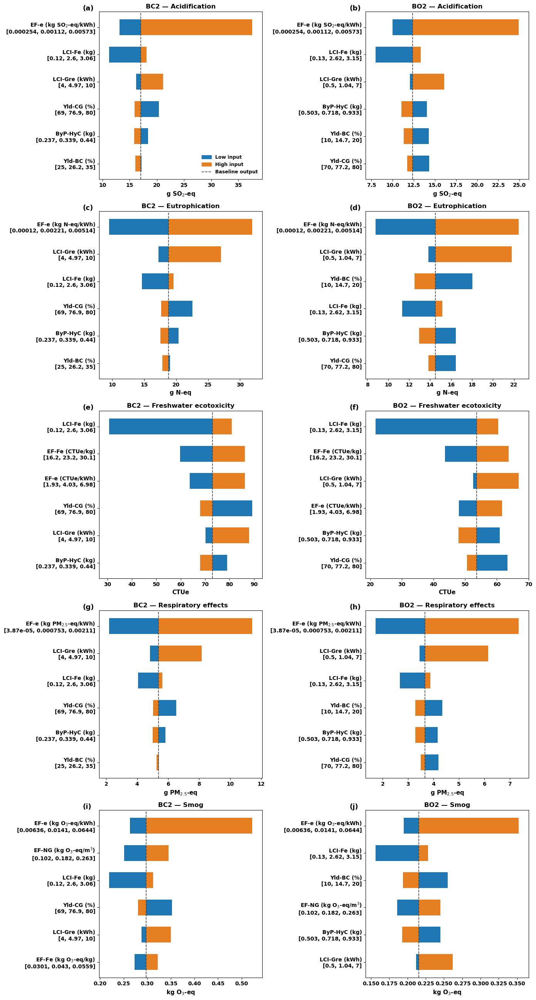

In [45]:
if RUN_FULL_ANALYSIS:
    fig_oat, axes_oat, oat_tables = PMC.make_oat_sensitivity_figure(
        oats,
        panels=OAT_PANELS,
        top_n=6,
        ncols=2,
        bounds_digits=3,
        show_input_ranges=True,
        show_legend=True,
        legend_panel=0,
        ytick_fontsize=10,
        ytick_fontweight="bold",
        xtick_fontsize=10,
        xtick_fontweight="bold",
        xlabel_fontsize=11,
        xlabel_fontweight="bold",
        title_fontsize=12,
        title_fontweight="bold",
        legend_fontsize=9,
        legend_fontweight="bold",
        show_panel_letters=True,
        panel_letter_fontsize=13,
        panel_letter_fontweight="bold",
        panel_letter_x=-0.10,
        panel_letter_y=1.04,
        figsize=(14, 26),
    )
    fig_oat.savefig(OUT / f"oat_selected_impacts_{OAT_PANEL_COL1}_{OAT_PANEL_COL2}.png", dpi=400, bbox_inches="tight")
    fig_oat.savefig(OUT / f"oat_selected_impacts_{OAT_PANEL_COL1}_{OAT_PANEL_COL2}.pdf", bbox_inches="tight")
    plt.show()
else:
    print("SKIPPED")


## 16. Preserve the standalone Monte Carlo SI visualization


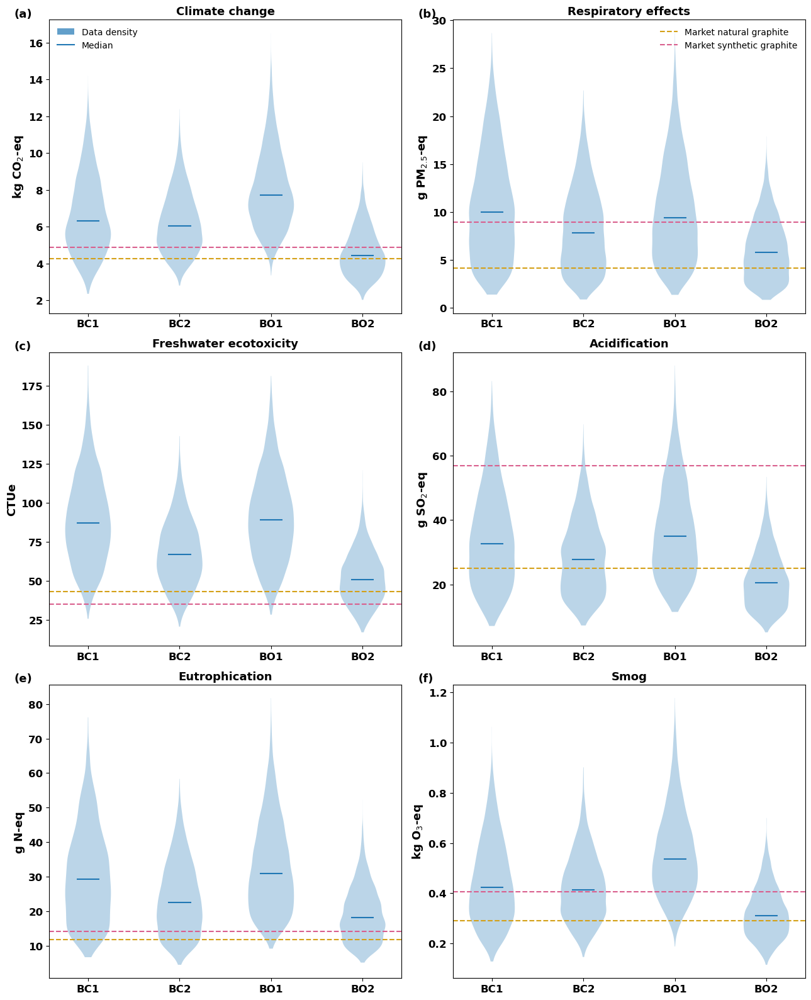

In [46]:
if RUN_FULL_ANALYSIS:
    fig_mc, axes_mc, mc_panel_specs = PMC.make_selected_mc_figure(
        mc,
        MC_CATEGORIES,
        ncols=2,
        include_market_references=True,
        tick_fontsize=12,
        tick_fontweight="bold",
        ylabel_fontsize=13,
        ylabel_fontweight="bold",
        title_fontsize=13,
        title_fontweight="bold",
        split_mc_legends=True,
        density_legend_panel=0,
        market_legend_panel=1,
        density_legend_loc="upper left",
        market_legend_loc="upper right",
        legend_fontsize=10,
        figsize=(13, 16),
    )
    fig_mc.savefig(OUT / "mc_selected_impacts.png", dpi=400, bbox_inches="tight")
    fig_mc.savefig(OUT / "mc_selected_impacts.pdf", bbox_inches="tight")
    plt.show()
else:
    print("SKIPPED")


## 17. Main Figure 4 — four OAT + four Monte Carlo panels


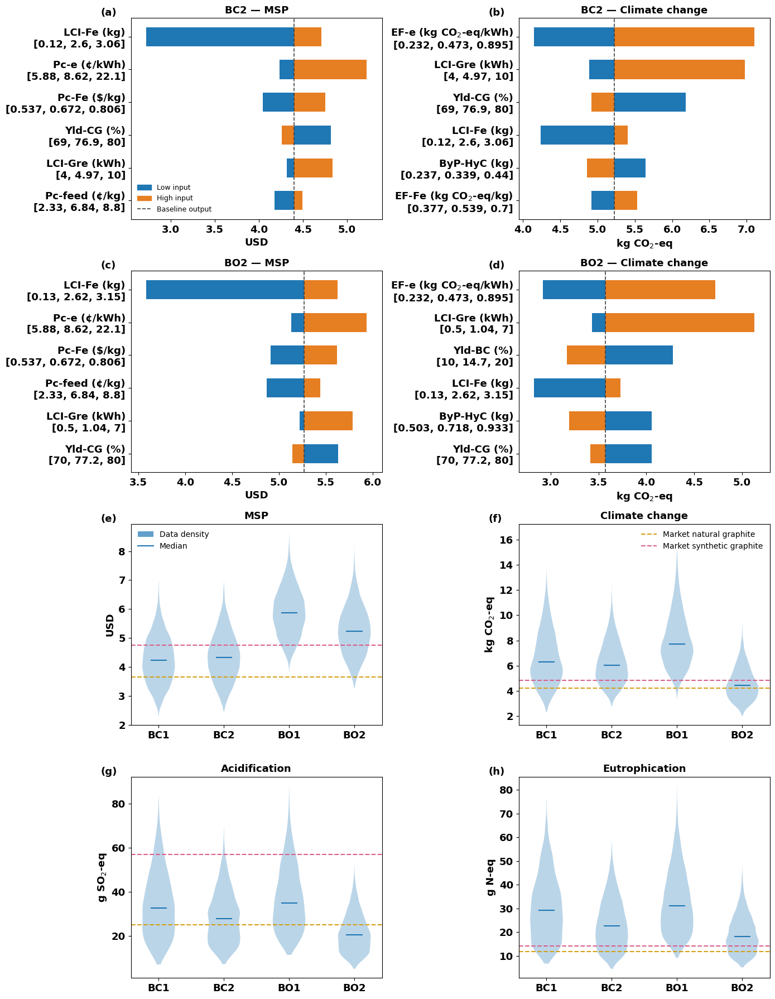

In [47]:
if RUN_FULL_ANALYSIS:
    fig4, axes4, oat_data = PMC.make_figure4_oat(
        mc,
        oats,
        sensitivity_panels=FIG4_OAT_PANELS,
        mc_categories=FIG4_MC_CATEGORIES,
        oat_ytick_fontsize=13,
        oat_ytick_fontweight="bold",
        oat_xtick_fontsize=13,
        oat_xtick_fontweight="bold",
        oat_xlabel_fontsize=13,
        oat_xlabel_fontweight="bold",
        oat_title_fontsize=13,
        oat_title_fontweight="bold",
        mc_tick_fontsize=13,
        mc_tick_fontweight="bold",
        mc_ylabel_fontsize=13,
        mc_ylabel_fontweight="bold",
        mc_title_fontsize=13,
        mc_title_fontweight="bold",
        split_mc_legends=True,
        mc_density_legend_panel="e",
        mc_market_legend_panel="f",
        mc_density_legend_loc="upper left",
        mc_market_legend_loc="upper right",
        mc_legend_fontsize=10,
        figsize=(14, 18),
        top_n=6,
    )
    fig4.savefig(OUT / "figure4_oat_mc.png", dpi=600, bbox_inches="tight")
    fig4.savefig(OUT / "figure4_oat_mc.pdf", bbox_inches="tight")
    plt.show()
else:
    print("SKIPPED")


## 18. Optional reagent-design sensitivity cases


In [48]:
reagent_cases = None
if RUN_FULL_ANALYSIS and RUN_REAGENT_CASES:
    import dataclasses
    CLIMATE = IMPACT_CATEGORIES[0]
    ASSIGNMENTS = {
        "default": {"Fe": "once_through", "HCl": "recycled"},
        "Fe recycled": {"Fe": "recycled_95", "HCl": "recycled"},
        "Fe make-up": {"Fe": "aspen_makeup", "HCl": "recycled"},
    }
    rows = []
    for sc in S.DEFAULT_SCENARIOS:
        x0 = ev_defaults[sc]
        for label, assignment in ASSIGNMENTS.items():
            explicit = CA.assignment_bounds(list(x0), x0, assignment)
            result = S.screen_scenario(
                sc,
                [CLIMATE],
                cfg=dataclasses.replace(CFG, n_samples=1000),
                spec=spec,
                explicit_bounds=explicit,
                **KW,
            )
            rows.append({
                "pathway": sc,
                "case": label,
                "MSP mean": np.nanmean(result.msp),
                "MSP sd": np.nanstd(result.msp),
                "LCIA mean": np.nanmean(result.lcia[S.method_slug(CLIMATE)]),
            })
    reagent_cases = pd.DataFrame(rows)
    reagent_cases.to_csv(OUT / "reagent_cases.csv", index=False)
    display(reagent_cases.round(3))
else:
    print("SKIPPED optional reagent cases")


SKIPPED optional reagent cases


## 19. Run manifest and final acceptance gate


In [49]:
from graphite_sus.uncertainty.artifacts import sha256_file

manifest = {
    "bw_project": PROJECT_NAME,
    "lca_sys_db": LCA_SYS_DB,
    "tea_sys_db": TEA_SYS_DB,
    "tea_profile": TEA_PROFILE,
    "protocol": PROTOCOL.to_dict(),
    "spec_csv": str(SPEC_CSV),
    "spec_sha256": sha256_file(SPEC_CSV),
    "tea_workbook_sha256": sha256_file(TEA_XLSX),
    "price_parameters_sha256": sha256_file(PRICE_PARAMETERS_XLSX),
    "electricity_reference": electricity_reference_manifest(),
    "market_reference": market_reference_manifest(),
    "fuel_ef_reference": fuel_reference_manifest(),
    "electricity_ef_reference": electricity_ef_reference_manifest(),
    "electricity_ef_reference_verified": bool((not electricity_ef_audit.empty) and electricity_ef_audit["passed"].all()),
    "reagent_case": REAGENT_CASE,
    "baseline_reconciliation_passed": bool(baseline_reconciliation["passed"].all()),
    "run_full_analysis": bool(RUN_FULL_ANALYSIS),
    "run_optional_sobol": bool(RUN_OPTIONAL_SOBOL),
}
if RUN_FULL_ANALYSIS:
    manifest.update({
        "n_shortlist": len(union),
        "stage1_iterations": PROTOCOL.screen.n_iterations,
        "stage2_mc_iterations": PROTOCOL.monte_carlo.n_iterations,
        "mc_failures": mc.attrs.get("failures", {}),
        "oat_mc_range_rows": len(oat_mc_range_audit),
        "main_figure": "figure4_oat_mc.png",
    })
(OUT / "run_manifest.json").write_text(json.dumps(manifest, indent=2, default=str))
manifest


{'bw_project': 'graphite_sys_v3',
 'lca_sys_db': 'graphite_system',
 'tea_sys_db': 'graphite_system_tea',
 'tea_profile': 'literature_hybrid',
 'protocol': {'lci_default_pct': 0.3,
  'price_default_pct': 0.2,
  'stage_bounds': (0.5, 1.5),
  'allocation_scheme': 'mass',
  'screen': {'n_iterations': 1000,
   'top_k_per_target': 5,
   'seed': 0,
   'per_method': True},
  'oat': {'levels': ('low', 'baseline', 'high')},
  'attribution': {'sobol_N': 128,
   'sobol_seed': 0,
   'calc_second_order': False,
   'surrogate_min_r2': 0.95,
   'convergence_max_delta_ST': 0.05},
  'monte_carlo': {'n_iterations': 5000, 'seed': 0, 'distribution': 'uniform'}},
 'spec_csv': '/mnt/g/My Drive/yale/Project-graphite/graphite_clean_project_spatial_v2_with_03b_legacy_visualization/graphite_clean_project_spatial_v2/graphite_sus/data/uncertainty_spec.csv',
 'spec_sha256': '05e928b40c329c9cf10f566b81c4a75e9c0e8dd2f8b8f51fd04e04bba3b54367',
 'tea_workbook_sha256': 'f968ff2f1f60695b11a0892108755c7aeeee3d003af4dc2bb

In [50]:
final_checks = dict(preflight_checks)
if RUN_FULL_ANALYSIS:
    final_checks.update({
        "stage1_no_tea_failures": all(s.n_failed_tea == 0 for s in screens.values()),
        "shortlist_nonempty": bool(union),
        "oat_all_baselines_in_bounds": all(
            ("base_inside_bounds" not in df.columns) or bool(df["base_inside_bounds"].all())
            for df in oats.values()
        ),
        "mc_all_finite": bool(np.isfinite(mc["value"]).all()),
        "mc_no_failures": all(all(v == 0 for v in d.values()) for d in mc.attrs["failures"].values()),
        "oat_mc_same_ranges": bool(oat_mc_range_audit.empty or oat_mc_range_audit["same_range"].all()),
        "figure4_written": (OUT / "figure4_oat_mc.png").exists(),
    })

final_table = pd.DataFrame([{"check": k, "passed": bool(v)} for k, v in final_checks.items()])
display(final_table)
assert final_table["passed"].all()

if RUN_FULL_ANALYSIS:
    print("UNCERTAINTY WORKFLOW ACCEPTED")
else:
    print("UNCERTAINTY PREFLIGHT ACCEPTED — toggle RUN_FULL_ANALYSIS=True for production run")


,check,passed
0,deterministic_baseline_reconciled,True
1,electricity_baseline_baseline,True
2,electricity_range_min_max,True
3,screen_protocol_1000,True
4,shortlist_protocol_top5,True
5,mc_protocol_5000,True
6,tea_profile_literature_hybrid,True
7,full_inventory_lca,True
8,netl_fuel_reference_applied,True
9,fuel_ranges_cover_central_reference,True


UNCERTAINTY WORKFLOW ACCEPTED
